# Projet 4 : Segmentez des clients d'un site de e-commerce
## Notebook de nettoyage et d'exploration de la base de données
Ce notebook contient le nettoyage de la base de données clientèles d'Olist téléchargeable à l'adresse : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce

### Contexte et objectifs
L'entreprise de e-commerce Olist souhaite comprendre les différents types de clients qu'elle possède. Elle souhaite donc ségmenter sa clientèle afin de pouvoir mieux communiquer en fonction du type de client. Pour cela elle souhaite classer les clients en fonction de leurs commandes passées ainsi que la satisfaction. 

### Modules Python

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import plotly.express as px

### fonctions 

In [2]:
def completion_rate(df) :
    """function to calculate the completion rate of each columns of a dataframe
    parameters : df : pandas.DataFrame
    return df : pandas.DataFrame with 2 columns : empty row, completion_rate and with the column name in index
    """
    odf = {'empty_rows':{}, "completion_rate": {}}
    for column in df.columns :
        odf["empty_rows"][column] = len(df[pd.isnull(df[column])])
        odf["completion_rate"][column] = len(df[pd.notnull(df[column])])/len(df)*100
    odf = pd.DataFrame(odf)
    odf.sort_values("completion_rate", inplace=True)
    return odf

In [3]:
def is_str(value, min_size=0, max_size=np.inf):
    """
    function to check if the value is a string with minimum char
    parameters : value
                    Value to check
                 min_size : int
                    Minimun number of char
    returns : str if value is a str with enough char
              np.NaN else
    """
    if type(min_size) != int :
        try : 
            min_size = int(min_size)
        except :
            min_size = 0
        print(f"Warning : min_size is not a integer, reset to {min_size}")
    if type(value) == str and len(value) >= min_size and len(value) <= max_size :
        return value
    else :
        if pd.notnull(value) :
            print(f"{value} is not correct value => ignored")
        return np.NaN

In [4]:
def is_int(value, min_val=-np.inf, max_val=np.inf) :
    """
    function to verify if a value is a int in the range [min_val, max_val]
    if yes, return the int, else, return np.NaN
    parameters : value
                 min_val : float
                 max_val : float
    return int
    """
    if pd.isnull(value) :
        return np.NaN
    elif type(value) == int :
        if value >= min_val and value <= max_val :
            return value
        else :
            print(f"{value} is not in the range [{min_val}, {max_val}]")
            return np.NaN
    elif type(value) == float :
        if value.is_integer():
            if value >= min_val and value <= max_val :
                return int(value)
            else :
                print(f"{value} is not in the range [{min_val}, {max_val}]")
                return np.NaN
        else :
            print(f"{value} is not an integer, round to {int(round(value))}")
            if int(round(value)) >= min_val and int(round(value)) <= max_val :
                return int(round(value))
            else :
                print(f"{value} is not in the range [{min_val}, {max_val}]")
                return np.NaN
    elif type(value) == str :
        if value.isdigit() :
            if int(value) >= min_val and int(val) <= max_val :
                return int(value)
            else :
                print(f"{value} is not in the range [{min_val}, {max_val}]")
                return np.NaN
        else :
            print(f"{value} is not a interger => ignored ")
            return np.NaN
    else :
        print(f"Unknown format {type(value)} => ignored")
        return np.NaN

In [5]:
def is_float(value, min_val=-np.inf, max_val=np.inf) :
    """
    function to verify if a value is a float in range [min_val, max_val]
    if yes, return the float, else return numpy.NaN

    parameters : value 
                 min_val = float
                 max_val = float
    
    returns : float
    """
    try :
        value = float(value)
    except ValueError :
        print(f"{value} is not a float")
        return np.NaN
    if value >= min_val and value <= max_val :
        return value
    else :
        print(f"{value} is not in the range [{min_val}, {max_val}]")
    

### Chargement des données
Les données sont regroupées dans différents fichiers csv :
- olist_customers_dataset.csv
- olist_geolocation_dataset.csv
- olist_order_items_dataset.csv
- olist_order_payments_dataset.csv
- olist_order_reviews_dataset.csv
- olist_order_dataset.csv
- olist_product_dataset.csv
- olist_sellers_dataset.csv
- product_category_name_translation.csv

D'après les informations disponibles sur Kaggle, les différentes bases de données sont organisées selon le schéma suivant :
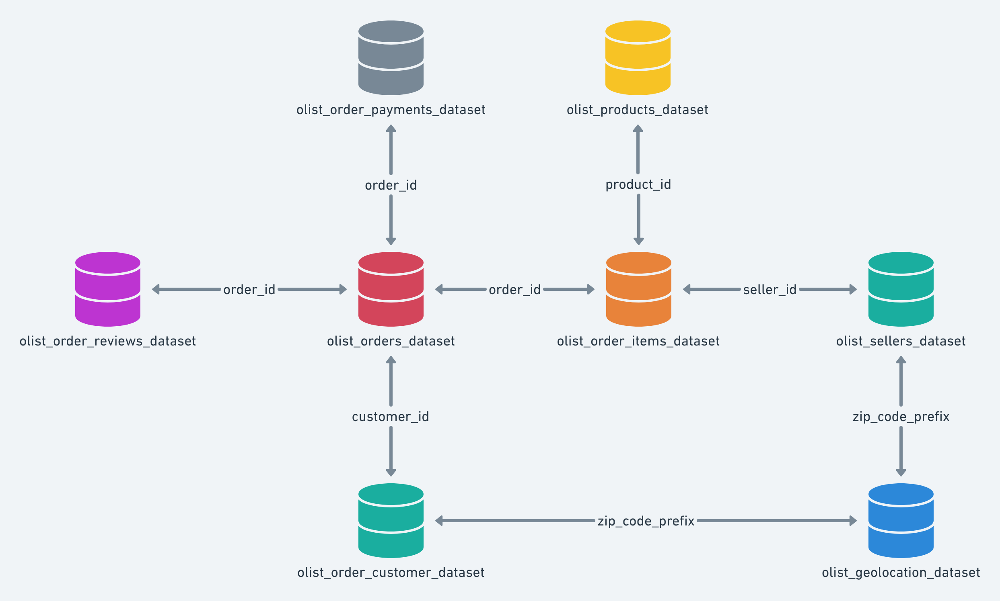

Chaque BDD va être chargée pour identifier les informations qu'elles contiennent.

In [6]:
DIR = "data/"

#### Customers

In [7]:
data_customers = pd.read_csv(DIR+"/olist_customers_dataset.csv", sep=",", skipinitialspace=True, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_customers)}")
print(f"Nombre de variables dans le dataset : {len(data_customers.columns)}")
print("Liste des variables : ")
print(", ".join(data_customers.columns))
print("type de variables : ")
print(data_customers.dtypes)

Nombre de lignes dans le dataset : 99441
Nombre de variables dans le dataset : 5
Liste des variables : 
customer_id, customer_unique_id, customer_zip_code_prefix, customer_city, customer_state
type de variables : 
customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object


In [8]:
data_customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


cette base de données regroupe les informations anonymisées de chaque client, incluant son ID, et sa localisation (état, ville, zip code)

 #### Geolocalisation

In [9]:
data_geo = pd.read_csv(DIR+"/olist_geolocation_dataset.csv", sep=",", skipinitialspace=True, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_geo)}")
print(f"Nombre de variables dans le dataset : {len(data_geo.columns)}")
print("Liste des variables : ")
print(", ".join(data_geo.columns))
print("type de variables : ")
print(data_geo.dtypes)

Nombre de lignes dans le dataset : 1000163
Nombre de variables dans le dataset : 5
Liste des variables : 
geolocation_zip_code_prefix, geolocation_lat, geolocation_lng, geolocation_city, geolocation_state
type de variables : 
geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object


In [10]:
data_geo.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


Cette base de données informe de la géolocalisation de chaque zip code. 

#### Order_items

In [11]:
data_o_items = pd.read_csv(DIR+"/olist_order_items_dataset.csv", sep=",", skipinitialspace=True, \
                         parse_dates=[4], dayfirst=False, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_o_items)}")
print(f"Nombre de variables dans le dataset : {len(data_o_items.columns)}")
print("Liste des variables : ")
print(", ".join(data_o_items.columns))
print("type de variables : ")
print(data_o_items.dtypes)

Nombre de lignes dans le dataset : 112650
Nombre de variables dans le dataset : 7
Liste des variables : 
order_id, order_item_id, product_id, seller_id, shipping_limit_date, price, freight_value
type de variables : 
order_id                       object
order_item_id                   int64
product_id                     object
seller_id                      object
shipping_limit_date    datetime64[ns]
price                         float64
freight_value                 float64
dtype: object


In [12]:
data_o_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


Cette base de données nous informe sur la composition de chaque commande, le vendeur, la date de l'envoi, le prix et le poids du colis

#### Order payments

In [13]:
data_o_pay = pd.read_csv(DIR+"/olist_order_payments_dataset.csv", sep=",", skipinitialspace=True, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_o_pay)}")
print(f"Nombre de variables dans le dataset : {len(data_o_pay.columns)}")
print("Liste des variables : ")
print(", ".join(data_o_pay.columns))
print("type de variables : ")
print(data_o_pay.dtypes)

Nombre de lignes dans le dataset : 103886
Nombre de variables dans le dataset : 5
Liste des variables : 
order_id, payment_sequential, payment_type, payment_installments, payment_value
type de variables : 
order_id                 object
payment_sequential        int64
payment_type             object
payment_installments      int64
payment_value           float64
dtype: object


In [14]:
data_o_pay.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


La base de données contient le détail des paiements de chaque commande

#### Order reviews

In [15]:
data_o_rev = pd.read_csv(DIR+"/olist_order_reviews_dataset.csv", sep=",", skipinitialspace=True, low_memory=False,\
                        parse_dates=[5,6], dayfirst=False)
print(f"Nombre de lignes dans le dataset : {len(data_o_rev)}")
print(f"Nombre de variables dans le dataset : {len(data_o_rev.columns)}")
print("Liste des variables : ")
print(", ".join(data_o_rev.columns))
print("type de variables : ")
print(data_o_rev.dtypes)

Nombre de lignes dans le dataset : 99224
Nombre de variables dans le dataset : 7
Liste des variables : 
review_id, order_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp
type de variables : 
review_id                          object
order_id                           object
review_score                        int64
review_comment_title               object
review_comment_message             object
review_creation_date       datetime64[ns]
review_answer_timestamp    datetime64[ns]
dtype: object


In [16]:
data_o_rev.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53


La base de données contient les notes et remarques pour chaque commande, ainsi que la date de la notation

#### Order

In [17]:
data_order = pd.read_csv(DIR+"/olist_orders_dataset.csv", sep=",", skipinitialspace=True, low_memory=False,
                        parse_dates=[3,4,5,6,7], dayfirst=False)
print(f"Nombre de lignes dans le dataset : {len(data_order)}")
print(f"Nombre de variables dans le dataset : {len(data_order.columns)}")
print("Liste des variables : ")
print(", ".join(data_order.columns))
print("type de variables : ")
print(data_order.dtypes)

Nombre de lignes dans le dataset : 99441
Nombre de variables dans le dataset : 8
Liste des variables : 
order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date
type de variables : 
order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
dtype: object


In [18]:
data_order.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


La base de données contient le détail de chaque commande, son statut et les dates de commande et de livraison

#### Products

In [19]:
data_product = pd.read_csv(DIR+"/olist_products_dataset.csv", sep=",", skipinitialspace=True, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_product)}")
print(f"Nombre de variables dans le dataset : {len(data_product.columns)}")
print("Liste des variables : ")
print(", ".join(data_product.columns))
print("type de variables : ")
print(data_product.dtypes)

Nombre de lignes dans le dataset : 32951
Nombre de variables dans le dataset : 9
Liste des variables : 
product_id, product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm
type de variables : 
product_id                     object
product_category_name          object
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
dtype: object


In [20]:
data_product.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


La base de données contient les descriptions de chaque produit vendu par le site

#### Sellers

In [21]:
data_sellers = pd.read_csv(DIR+"/olist_sellers_dataset.csv", sep=",", skipinitialspace=True, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_sellers)}")
print(f"Nombre de variables dans le dataset : {len(data_sellers.columns)}")
print("Liste des variables : ")
print(", ".join(data_sellers.columns))
print("type de variables : ")
print(data_sellers.dtypes)

Nombre de lignes dans le dataset : 3095
Nombre de variables dans le dataset : 4
Liste des variables : 
seller_id, seller_zip_code_prefix, seller_city, seller_state
type de variables : 
seller_id                 object
seller_zip_code_prefix     int64
seller_city               object
seller_state              object
dtype: object


In [22]:
data_sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


Cette base de données regroupe les informations sur les vendeurs

#### Catégories des produits

In [23]:
data_cat = pd.read_csv(DIR+"/product_category_name_translation.csv", sep=",", skipinitialspace=True, low_memory=False)
print(f"Nombre de lignes dans le dataset : {len(data_cat)}")
print(f"Nombre de variables dans le dataset : {len(data_cat.columns)}")
print("Liste des variables : ")
print(", ".join(data_cat.columns))
print("type de variables : ")
print(data_cat.dtypes)

Nombre de lignes dans le dataset : 71
Nombre de variables dans le dataset : 2
Liste des variables : 
product_category_name, product_category_name_english
type de variables : 
product_category_name            object
product_category_name_english    object
dtype: object


In [24]:
data_cat.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


Cette base de données regroupe les différentes catégories de produits avec la traduction en anglais

### Nettoyage 
un nettoyage rapide de chaque base de données est réalisé afin de supprimer les valeurs abérantes.

#### Customers
Les ID ne sont pas néttoyés puisqu'ils semblent être une suite aléatoire de chiffres et de lettres.  
On vérifie que le zip code soit un entier, la ville soit un str de taille minimum 3 et que l'état soit également un str de taille inférieur à 4 (abréviations).

In [25]:
data_customers["customer_zip_code_prefix"] = data_customers["customer_zip_code_prefix"].apply(is_int)
data_customers["customer_city"] = data_customers["customer_city"].apply(is_str, min_size=3)
data_customers["customer_state"] = data_customers["customer_state"].apply(is_str, max_size=3)

L'ensemble des informations de cette base de données semble correcte

 #### Geolocalisation
 - zip code doit être un int
 - latitude doit être un float entre -90 et +90
 - longitude doit être un float entre -180 et 180
 - la ville doit être un str de taille supérieure à 3
 - l'état doit être un str de taille inférieure à 4

In [26]:
print("geolocation_zip_code_prefix")
data_geo["geolocation_zip_code_prefix"] = data_geo["geolocation_zip_code_prefix"].apply(is_int)
print("geolocation_lat")
data_geo["geolocation_lat"] = data_geo["geolocation_lat"].apply(is_float, min_val=-90, max_val=90)
print("geolocation_lng")
data_geo["geolocation_lng"] = data_geo["geolocation_lng"].apply(is_float, min_val=-180, max_val=180)
print("geolocation_city")
data_geo["geolocation_city"] = data_geo["geolocation_city"].apply(is_str, min_size=3)
print("geolocation_state")
data_geo["geolocation_state"] = data_geo["geolocation_state"].apply(is_str, max_size=3)

geolocation_zip_code_prefix
geolocation_lat
geolocation_lng
geolocation_city
sp is not correct value => ignored
sp is not correct value => ignored
sp is not correct value => ignored
rj is not correct value => ignored
bh is not correct value => ignored
geolocation_state


La base de données est plutôt bien renseignée. Il y a uniquement quelques villes abérantes

#### Order_items
- order_id, product_id, seller_id sont des ID : une suite de chiffres et de lettres aléatoires
- order_item_id est l'id du produit dans la commande : doit être un int > 0
- shipping_limit_date : une date : on ne vérifie rien, la lecture du csv a été paramétrer pour créer la date
- price : un float > 0 
- freight_value : un float > 0

In [27]:
data_o_items["price"] = data_o_items["price"].apply(is_float, min_val=0)
data_o_items["freight_value"] = data_o_items["freight_value"].apply(is_float, min_val=0)
data_o_items["order_item_id"] = data_o_items["order_item_id"].apply(is_int, min_val=0)

La base de données ne contient pas de valeurs abérantes

#### Order payments
- order_id : ID => ne rien faire
- payment_sequential : int >0
- payment_type : str
- payment_installments : int >= 0 
- payment_value : float > 0

In [28]:
print("payment_sequential")
data_o_pay["payment_sequential"] = data_o_pay["payment_sequential"].apply(is_int, min_val=1)
print("payment_type")
data_o_pay["payment_type"] = data_o_pay["payment_type"].apply(is_str)
print("payment_installments")
data_o_pay["payment_installments"] = data_o_pay["payment_installments"].apply(is_int, min_val=0)
print("payment_value")
data_o_pay["payment_value"] = data_o_pay["payment_value"].apply(is_float, min_val=0)

payment_sequential
payment_type
payment_installments
payment_value


Aucune valeur abérante

#### Order reviews
- review_id, order_id : ID
- review_score : int <=5 et >=0
- review_comment_title : str
- review_comment_message : str  
- review_creation_date, review_answer_timestamp : date : vérifié lors de la lecture

In [29]:
data_o_rev["review_score"] = data_o_rev["review_score"].apply(is_int, min_val=0, max_val=5)
data_o_rev["review_comment_title"] = data_o_rev["review_comment_title"].apply(is_str)
data_o_rev["review_comment_message"] = data_o_rev["review_comment_message"].apply(is_str)

#### Order
- order_id, customer_id : ID
- order_status : str
- order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date : date, déjà vérifié lors de la lecture

In [30]:
data_order["order_status"] = data_order["order_status"].apply(is_str)

Pas de valeur abérante

#### Products
- product_id : ID
- product_category_name : str 
- product_name_lenght, product_description_lenght : int >= 0
- product_photos_qty : int >=0
- product_weight_g : float > 0
- product_length_cm, product_height_cm, product_width_cm : float >0

In [31]:
print("product_category_name")
data_product["product_category_name"] = data_product["product_category_name"].apply(is_str)
for col in ["product_name_lenght", "product_description_lenght", "product_photos_qty"] :
    print(col)
    data_product[col] = data_product[col].apply(is_int, min_val=0)
for col in ["product_weight_g", "product_length_cm", "product_height_cm", "product_width_cm"] :
    print(col)
    data_product[col] = data_product[col].apply(is_float, min_val=0)

product_category_name
product_name_lenght
product_description_lenght
product_photos_qty
product_weight_g
nan is not in the range [0, inf]
nan is not in the range [0, inf]
product_length_cm
nan is not in the range [0, inf]
nan is not in the range [0, inf]
product_height_cm
nan is not in the range [0, inf]
nan is not in the range [0, inf]
product_width_cm
nan is not in the range [0, inf]
nan is not in the range [0, inf]


Aucune valeur abérante

#### Sellers
- seller_id : ID
- seller_zip_code_prefix : int 
- seller_city : str de taille min 3
- seller_state : str de taille max 3

In [32]:
data_sellers["seller_zip_code_prefix"] = data_sellers["seller_zip_code_prefix"].apply(is_int)
data_sellers["seller_city"] = data_sellers["seller_city"].apply(is_str, min_size=3)
data_sellers["seller_state"] = data_sellers["seller_state"].apply(is_str, max_size=3)

sp is not correct value => ignored
sp is not correct value => ignored
sp is not correct value => ignored
sp is not correct value => ignored


Très peu de valeurs abérantes

#### Catégories 
- product_category_name, product_category_name_english : str

In [33]:
for col in ["product_category_name", "product_category_name_english"] :
    data_cat[col] = data_cat[col].apply(is_str)

Aucune valeur abérante

### Taux de completion

#### Customers

In [34]:
completion_rate(data_customers)

,empty_rows,completion_rate
customer_id,0,100.0
customer_unique_id,0,100.0
customer_zip_code_prefix,0,100.0
customer_city,0,100.0
customer_state,0,100.0


L'ensemble des variables sont parfaitement renseignées : aucune entrée n'est manquante

 #### Geolocalisation

In [35]:
completion_rate(data_geo)

,empty_rows,completion_rate
geolocation_city,5,99.9995
geolocation_zip_code_prefix,0,100.0000
geolocation_lat,0,100.0000
geolocation_lng,0,100.0000
geolocation_state,0,100.0000


A part les valeurs abérantes détectées pendant le nettoyage, l'ensemble des variables est parfaitement renseigné

#### Order_items

In [36]:
completion_rate(data_o_items)

,empty_rows,completion_rate
order_id,0,100.0
order_item_id,0,100.0
product_id,0,100.0
seller_id,0,100.0
shipping_limit_date,0,100.0
price,0,100.0
freight_value,0,100.0


La base de données est parfaitement renseignée

#### Order payments

In [37]:
completion_rate(data_o_pay)

,empty_rows,completion_rate
order_id,0,100.0
payment_sequential,0,100.0
payment_type,0,100.0
payment_installments,0,100.0
payment_value,0,100.0


toutes les valeurs sont renseignées

#### Order reviews

In [38]:
completion_rate(data_o_rev)

,empty_rows,completion_rate
review_comment_title,87658,11.656454
review_comment_message,58256,41.288398
review_id,0,100.000000
order_id,0,100.000000
review_score,0,100.000000
review_creation_date,0,100.000000
review_answer_timestamp,0,100.000000


Les commentaires sont peu renseignés, le reste est parfaitement renseigné

#### Order

In [39]:
completion_rate(data_order)

,empty_rows,completion_rate
order_delivered_customer_date,2965,97.018332
order_delivered_carrier_date,1783,98.206977
order_approved_at,160,99.839101
order_id,0,100.000000
customer_id,0,100.000000
order_status,0,100.000000
order_purchase_timestamp,0,100.000000
order_estimated_delivery_date,0,100.000000


Les dates de livraison ne sont pas toujours renseignées

#### Products

In [40]:
completion_rate(data_product)

,empty_rows,completion_rate
product_category_name,610,98.148766
product_name_lenght,610,98.148766
product_description_lenght,610,98.148766
product_photos_qty,610,98.148766
product_weight_g,2,99.993930
product_length_cm,2,99.993930
product_height_cm,2,99.993930
product_width_cm,2,99.993930
product_id,0,100.000000


Certains produits ne sont pas catégorisés, mais cela ne représente qu'environ 2%

#### Sellers

In [41]:
completion_rate(data_sellers)

,empty_rows,completion_rate
seller_city,4,99.870759
seller_id,0,100.000000
seller_zip_code_prefix,0,100.000000
seller_state,0,100.000000


A part quelques villes manquantes, la base de données est parfaitement renseignée

#### Categories

In [42]:
completion_rate(data_cat)

,empty_rows,completion_rate
product_category_name,0,100.0
product_category_name_english,0,100.0


Aucune valeur manquante

### Détections des doublons
afin de faciliter la fusion des bases de données et éviter les erreurs,  
on vérifie qu'aucun doublon n'est présent.

#### Customers
on vérifie que l'ID du client n'est pas présent plusieurs fois

In [43]:
ID_counts = data_customers["customer_id"].value_counts()
print(f"Nombre de doublons : {len(ID_counts[ID_counts>1])}")
ID_counts = data_customers["customer_unique_id"].value_counts()
print(f"Nombre de doublons : {len(ID_counts[ID_counts>1])}")
print(ID_counts)

Nombre de doublons : 0
Nombre de doublons : 2997
8d50f5eadf50201ccdcedfb9e2ac8455    17
3e43e6105506432c953e165fb2acf44c     9
1b6c7548a2a1f9037c1fd3ddfed95f33     7
ca77025e7201e3b30c44b472ff346268     7
6469f99c1f9dfae7733b25662e7f1782     7
                                    ..
081f07439678af2da7755a0aa572154d     1
9c57789a6a587f4efcfb01e36c106014     1
9e4c21635f640562de1a6976374fba03     1
06c0ea6ee892364d1608ee47aa9f56a0     1
84732c5050c01db9b23e19ba39899398     1
Name: customer_unique_id, Length: 96096, dtype: int64


In [44]:
data_customers[data_customers["customer_unique_id"] == "8d50f5eadf50201ccdcedfb9e2ac8455"]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
14186,1bd3585471932167ab72a84955ebefea,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
15321,a8fabc805e9a10a3c93ae5bff642b86b,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
16654,897b7f72042714efaa64ac306ba0cafc,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
36122,b2b13de0770e06de50080fea77c459e6,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
38073,42dbc1ad9d560637c9c4c1533746f86d,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
40141,dfb941d6f7b02f57a44c3b7c3fefb44b,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
48614,65f9db9dd07a4e79b625effa4c868fcb,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
52574,1c62b48fb34ee043310dcb233caabd2e,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
58707,a682769c4bc10fc6ef2101337a6c83c9,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP
67996,6289b75219d757a56c0cce8d9e427900,8d50f5eadf50201ccdcedfb9e2ac8455,4045,sao paulo,SP


La base de données ne semble pas contenir de doublons, "customer_unique_id" semble être un ID créé pour chaque commande.

 #### Geolocalisation

In [45]:
data_geo.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [46]:
zip_code_counts = data_geo["geolocation_zip_code_prefix"].value_counts()
print(f"Nombre de doublons : {len(zip_code_counts[zip_code_counts>1])}")

Nombre de doublons : 17972


un grand nombre de zip code sont en double

In [47]:
print(zip_code_counts)
print(data_geo[data_geo["geolocation_zip_code_prefix"] == 24220])

24220    1146
24230    1102
38400     965
35500     907
11680     879
         ... 
71750       1
71742       1
26475       1
26357       1
29826       1
Name: geolocation_zip_code_prefix, Length: 19015, dtype: int64
        geolocation_zip_code_prefix  geolocation_lat  geolocation_lng  \
470805                        24220       -22.905817       -43.106989   
470811                        24220       -22.902306       -43.112545   
470812                        24220       -22.904567       -43.110491   
470820                        24220       -22.902575       -43.109192   
470821                        24220       -22.907500       -43.106170   
...                             ...              ...              ...   
474265                        24220       -22.904023       -43.111683   
474266                        24220       -22.905393       -43.100512   
474269                        24220       -22.906420       -43.104933   
474270                        24220       -22.909701 

Il semble que les différences peuvent être uniquement une faible variation de la latitude et de la longitude.
On va donc supprimer les doublons en moyennant ces valeurs et en prenant la valeur la plus fréquente pour l'état et la ville.  


In [48]:
double = data_geo["geolocation_zip_code_prefix"].value_counts()
double = double[double > 1 ].index
for code in  double:
    tmp = {"geolocation_zip_code_prefix" : code }
    for col in ["geolocation_lat", "geolocation_lng"] :
        mean = data_geo[data_geo["geolocation_zip_code_prefix"] == code][col].median()
        tmp[col] = mean
        
    for col in ["geolocation_city", "geolocation_state"] :
        val = data_geo[data_geo["geolocation_zip_code_prefix"]== code][col].value_counts().index[0]
        tmp[col] = val
    data_geo = data_geo.drop(data_geo[data_geo["geolocation_zip_code_prefix"] == code].index)
    data_geo = data_geo.append(tmp, ignore_index=True)

In [49]:
zip_code_counts = data_geo["geolocation_zip_code_prefix"].value_counts()
print(f"Nombre de doublons : {len(zip_code_counts[zip_code_counts>1])}")

Nombre de doublons : 0


#### Order_items

In [50]:
counts = data_o_items["order_id"].value_counts()
counts

8272b63d03f5f79c56e9e4120aec44ef    21
1b15974a0141d54e36626dca3fdc731a    20
ab14fdcfbe524636d65ee38360e22ce8    20
9ef13efd6949e4573a18964dd1bbe7f5    15
428a2f660dc84138d969ccd69a0ab6d5    15
                                    ..
5a0911d70c1f85d3bed0df1bf693a6dd     1
5a082b558a3798d3e36d93bfa8ca1eae     1
5a07264682e0b8fbb3f166edbbffc6e8     1
5a071192a28951b76774e5a760c8c9b7     1
fffe41c64501cc87c801fd61db3f6244     1
Name: order_id, Length: 98666, dtype: int64

In [51]:
data_o_items[data_o_items["order_id"] == "8272b63d03f5f79c56e9e4120aec44ef"]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
57297,8272b63d03f5f79c56e9e4120aec44ef,1,270516a3f41dc035aa87d220228f844c,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57298,8272b63d03f5f79c56e9e4120aec44ef,2,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57299,8272b63d03f5f79c56e9e4120aec44ef,3,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57300,8272b63d03f5f79c56e9e4120aec44ef,4,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57301,8272b63d03f5f79c56e9e4120aec44ef,5,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57302,8272b63d03f5f79c56e9e4120aec44ef,6,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57303,8272b63d03f5f79c56e9e4120aec44ef,7,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57304,8272b63d03f5f79c56e9e4120aec44ef,8,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57305,8272b63d03f5f79c56e9e4120aec44ef,9,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89
57306,8272b63d03f5f79c56e9e4120aec44ef,10,05b515fdc76e888aada3c6d66c201dff,2709af9587499e95e803a6498a5a56e9,2017-07-21 18:25:23,1.2,7.89


Pour identifier des doublons, il faut combiner les colonnes order_id et order_item_id.

In [52]:
names = data_o_items["order_id"]+"_"+data_o_items["order_item_id"].astype(str)
counts = names.value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")

Nombre de doublons : 0


Cette base de données ne contient pas de doublon.

#### Order payments

In [53]:
counts = data_o_pay["order_id"].value_counts()

In [54]:
data_o_pay[data_o_pay["order_id"]== "fa65dad1b0e818e3ccc5cb0e39231352"]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
4885,fa65dad1b0e818e3ccc5cb0e39231352,27,voucher,1,66.02
9985,fa65dad1b0e818e3ccc5cb0e39231352,4,voucher,1,29.16
14321,fa65dad1b0e818e3ccc5cb0e39231352,1,voucher,1,3.71
17274,fa65dad1b0e818e3ccc5cb0e39231352,9,voucher,1,1.08
19565,fa65dad1b0e818e3ccc5cb0e39231352,10,voucher,1,12.86
23074,fa65dad1b0e818e3ccc5cb0e39231352,2,voucher,1,8.51
24879,fa65dad1b0e818e3ccc5cb0e39231352,25,voucher,1,3.68
28330,fa65dad1b0e818e3ccc5cb0e39231352,5,voucher,1,0.66
29648,fa65dad1b0e818e3ccc5cb0e39231352,6,voucher,1,5.02
32519,fa65dad1b0e818e3ccc5cb0e39231352,11,voucher,1,4.03


Comme précédemment, pour détecter des doublons, il faut combiner les colonnes order_id et payment_sequential

In [55]:
name = data_o_pay["order_id"]+'_'+data_o_pay["payment_sequential"].astype(str)
counts = name.value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")

Nombre de doublons : 0


Cette base de donnée ne contient pas de doublon

#### Order reviews

In [56]:
counts = data_o_rev['order_id'].value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")
print(counts)

Nombre de doublons : 547
c88b1d1b157a9999ce368f218a407141    3
8e17072ec97ce29f0e1f111e598b0c85    3
df56136b8031ecd28e200bb18e6ddb2e    3
03c939fd7fd3b38f8485a0f95798f1f6    3
5cb890a68b91b6158d69257e4e2bc359    2
                                   ..
5b4e9a12d219f34f5c2de9f8d620b19d    1
a6da096d974acc000962856d7386448a    1
75e0647c26de647eca3421e9cc66c9da    1
bad0467c52f23cdc71e9fa139d4a8afd    1
90531360ecb1eec2a1fbb265a0db0508    1
Name: order_id, Length: 98673, dtype: int64


In [57]:
data_o_rev[data_o_rev['order_id'] == "c88b1d1b157a9999ce368f218a407141"]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
1985,ffb8cff872a625632ac983eb1f88843c,c88b1d1b157a9999ce368f218a407141,3,NaN,NaN,2017-07-22,2017-07-26 13:41:07
82525,202b5f44d09cd3cfc0d6bd12f01b044c,c88b1d1b157a9999ce368f218a407141,5,NaN,NaN,2017-07-22,2017-07-26 13:40:22
89360,fb96ea2ef8cce1c888f4d45c8e22b793,c88b1d1b157a9999ce368f218a407141,5,NaN,NaN,2017-07-21,2017-07-26 13:45:15


Une commande ne peut pas avoir plusieurs notes : pour chaque doublon, on prend la moyenne du score et des dates.  
Les commentaires sont concatenés.  
Le review ID est selectionné aléatoirement parmis les id et on ajoute "_mean" à la fin 

In [58]:
double = data_o_rev["order_id"].value_counts()
double = double[double > 1 ].index
new_lines = {"review_id": [], "order_id" : [], "review_score" : [],\
            'review_answer_timestamp' : [],
            "review_creation_date" : [],
            "review_comment_title" : [], "review_comment_message" : []}
#dt = {}
#for col in data_o_rev.columns :
#    dt[col] = data_o_rev[col].dtype
#print(dt)
for id in double:
    new_lines["review_id"].append(data_o_rev[data_o_rev["order_id"] == id]['review_id'].iloc[0]+"_mean")
    new_lines["order_id"].append(id)
    new_lines["review_score"].append(data_o_rev[data_o_rev["order_id"] == id]['review_score'].mean())
    #tmp = {"review_id" : data_o_rev[data_o_rev["order_id"] == id]['review_id'].iloc[0]+"_mean",\
    #      "order_id" :id,\
    #      "review_score": data_o_rev[data_o_rev["order_id"] == id]['review_score'].mean()}
    for col in ["review_comment_title", "review_comment_message"] :
        text = ""
        for txt in data_o_rev[data_o_rev["order_id"] == id]['review_comment_title'] :
            if pd.notnull(txt) :
                text += txt
        if text == "" :
            #tmp[col] = np.NaN
            new_lines[col].append(np.NaN)
        else :
            #tmp[col] = text
            new_lines[col].append(text)
    #print(data_o_rev[data_o_rev["order_id"] == id]['review_answer_timestamp'].dtype)
    #tmp['review_answer_timestamp'] = data_o_rev[data_o_rev["order_id"] == id]['review_answer_timestamp'].mean().strftime('%Y-%m-%d %X')
    #tmp["review_creation_date"] = data_o_rev[data_o_rev["order_id"] == id]['review_creation_date'].mean().date()
    #print(tmp["review_creation_date"].dtype)
    new_lines["review_answer_timestamp"].append(data_o_rev[data_o_rev["order_id"] == id]['review_answer_timestamp'].mean().strftime('%Y-%m-%d %X'))
    new_lines["review_creation_date"].append(data_o_rev[data_o_rev["order_id"] == id]['review_creation_date'].mean().date())
    data_o_rev = data_o_rev.drop(data_o_rev[data_o_rev["order_id"] == id].index)
    #data_o_rev = data_o_rev.append(tmp, ignore_index=True)
    #for col in data_o_rev.columns :
    #    data_o_rev[col] = data_o_rev[col].astype(dt[col])
    #data_o_rev = data_o_rev.astype(dt)
    #print(data_o_rev[data_o_rev["order_id"] == id]['review_answer_timestamp'].dtype)
new_lines = pd.DataFrame(new_lines)
data_o_rev = pd.concat([data_o_rev, new_lines], axis=0)
#data_o_rev = data_o_rev.append(new_lines, ignore_index=True)

In [59]:
counts = data_o_rev['order_id'].value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")


Nombre de doublons : 0


#### Order

In [60]:
counts = data_order['order_id'].value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")

Nombre de doublons : 0


Cette base de données ne contient pas de doublon

#### Products

In [61]:
data_product.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [62]:
counts = data_product['product_id'].value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")

Nombre de doublons : 0


Cette base de données ne contient pas de doublon

#### Sellers

In [63]:
data_sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [64]:
counts = data_sellers['seller_id'].value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")

Nombre de doublons : 0


Cette base de données ne contient pas de doublon

#### Categories

In [65]:
data_cat.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [66]:
counts = data_cat['product_category_name'].value_counts()
print(f"Nombre de doublons : {len(counts[counts>1])}")

Nombre de doublons : 0


Cette base de données ne contient pas de doublon

### regrouper toutes les bases de données dans une seule

Pour faciliter les analyses, l'ensemble des données utiles dans les différentes bases de données sont regroupées dans un seul et même DataFrame.  

Dans un premier temps, le regroupement a été fait "à la main", avant d'être réalisé avec la fonction merge plus efficace.  
Pour débuter, on recupère l'ensemble des clients ainsi que la localisation.  

In [67]:
# DATA= pd.DataFrame(columns = ['customer_id', 'city', 'state', 'zipcode', "longitude", "latitude"])
# DATA["customer_id"] = data_customers["customer_unique_id"].unique()
# for col in ['order', "orders_date", "order_price", "product_buy", "review"] :
#     DATA[col] = np.empty((len(DATA), 0)).tolist()

# count = 0
# for i in range(0, len(DATA)) :
#     print(f"{i}/{len(DATA)}", end='\r')
#     id = DATA["customer_id"].iloc[i] 
#     DATA["city"].iloc[i] = data_customers[data_customers["customer_unique_id"] == id]["customer_city"].iloc[0]
#     DATA["state"].iloc[i] = data_customers[data_customers["customer_unique_id"] == id]["customer_state"].iloc[0]
#     code = data_customers[data_customers["customer_unique_id"] == id]["customer_zip_code_prefix"].iloc[0]
#     DATA["zipcode"].iloc[i] = code
#     if code in data_geo["geolocation_zip_code_prefix"].values :
#         DATA['longitude'].iloc[i] = data_geo[data_geo["geolocation_zip_code_prefix"] == code]["geolocation_lng"].iloc[0]
#         DATA["latitude"].iloc[i] = data_geo[data_geo["geolocation_zip_code_prefix"] == code]["geolocation_lat"].iloc[0]
#     else :
#         DATA['longitude'].iloc[i] = np.NaN
#         DATA["latitude"].iloc[i] = np.NaN
#     for id_unique in data_customers[data_customers["customer_unique_id"]==id]["customer_id"].values :
#         o_id = data_order[data_order["customer_id"]==id_unique]['order_id'].values
#         if len(o_id) > 1 :
#             print(id, o_id)
#         elif len(o_id) == 1 :
#             o_id = o_id[0]
#             DATA["order"].iloc[i].append(o_id)
#             DATA["orders_date"].iloc[i].append(data_order[data_order["order_id"] == o_id]["order_purchase_timestamp"].iloc[0])
#             DATA["product_buy"].iloc[i].append(list(data_o_items[data_o_items['order_id']==o_id]["product_id"].values))
#             DATA["order_price"].iloc[i].append(data_o_items[data_o_items['order_id']==o_id]["price"].sum())
#             if o_id in data_o_rev['order_id'].values :
#                 DATA['review'].iloc[i].append(data_o_rev[data_o_rev['order_id'] == o_id]['review_score'].iloc[0])
#             else :
#                 DATA['review'].iloc[i].append(np.NaN)
#         else :
#             print(id, o_id)
#             raise
    
#     count+=1
#     #break

Ajout de la variable contentant le nombre de commande réalisé.

In [68]:
#DATA["norder"] = DATA["order"].apply(lambda x: len(x))

La base de données créée est sauvegardée.

In [69]:
#DATA.to_csv('database_new_cleaned.csv', index=False)

#DATA.to_parquet('database_new_cleaned.parquet')

#with open('database_new_cleaned.pkl', 'wb') as ofile :
#    pickle.dump(DATA, ofile)

In [70]:
#with open('database_new_cleaned.pkl', 'rb') as ofile :
#    DATA = pickle.load(ofile)

Regroupement en utilisant la fonction merge

In [71]:
data_merge = pd.merge(data_customers, data_geo[["geolocation_zip_code_prefix", "geolocation_lat", "geolocation_lng"]], \
                      left_on="customer_zip_code_prefix",right_on="geolocation_zip_code_prefix", how='left')
data_merge = data_merge.drop('geolocation_zip_code_prefix', axis=1)
data_merge = pd.merge(data_merge, data_order[["order_id", "customer_id", "order_purchase_timestamp"]] , \
                      on="customer_id", how='left')
data_merge = pd.merge(data_merge, data_o_rev[["order_id", "review_score"]] , on="order_id", how="left")
data_merge = pd.merge(data_merge, data_o_items[["order_id", "order_item_id", "product_id", "price"]], \
                      on="order_id", how="left")
data_merge = pd.merge(data_merge, data_product[["product_id", "product_category_name"]], on="product_id", how="left")

In [72]:
data_merge.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_lat,geolocation_lng,order_id,order_purchase_timestamp,review_score,order_item_id,product_id,price,product_category_name
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,-20.502070,-47.396822,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,4.0,1.0,a9516a079e37a9c9c36b9b78b10169e8,124.99,moveis_escritorio
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,-23.727299,-46.542631,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,5.0,1.0,4aa6014eceb682077f9dc4bffebc05b0,289.00,utilidades_domesticas
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,-23.531294,-46.656404,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,5.0,1.0,bd07b66896d6f1494f5b86251848ced7,139.94,moveis_escritorio
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,-23.497390,-46.182342,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,5.0,1.0,a5647c44af977b148e0a3a4751a09e2e,149.94,moveis_escritorio
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,-22.973309,-47.141530,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,5.0,1.0,9391a573abe00141c56e38d84d7d5b3b,230.00,casa_conforto


In [73]:
for col in data_merge.columns :
    print(col)
    print(data_merge[col].isna().sum())

customer_id
0
customer_unique_id
0
customer_zip_code_prefix
0
customer_city
0
customer_state
0
geolocation_lat
306
geolocation_lng
306
order_id
0
order_purchase_timestamp
0
review_score
961
order_item_id
775
product_id
775
price
775
product_category_name
2378


In [74]:
for code in data_merge[data_merge["geolocation_lat"].isna()]["customer_zip_code_prefix"].unique() :
    if len(data_geo[data_geo["geolocation_zip_code_prefix"]==code]) > 0 :
        print(code)
        print(data_geo[data_geo["geolocation_zip_code_prefix"]==code])

In [75]:
for id in data_merge[data_merge["order_item_id"].isna()]['order_id'] :
    if len(data_merge[data_merge["order_item_id"]== id]) > 0 :
        print(id)
        print(data_o_items[data_o_items['order_id'] == id])

La base de données créée contient des valeurs non renseignées.  
Après vérification, il ne s'agit pas d'erreurs lors de la fusion, mais bien des valeurs manquantes dans les différentes bases de données.  
Il est décidé de les supprimer pour effectuer la segmentation

### suppression des lignes non renseignées

- geolocation_lat et geolocation_lng : ne seront pas utilisés pour la clusterisation, on conserve
- review_score : suppression de la commande
- product_category_name : ne sera pas utilisé, on conserve
- order_item_id, product_id, product_id : il s'agit de commande n'ont trouvé dans la base de données order_items. on supprime les commandes liées.

In [76]:
for o_id in data_merge[data_merge['review_score'].isna()]["order_id"].unique() :
    data_merge = data_merge.drop(data_merge.loc[data_merge["order_id"]==o_id].index, inplace=False)

In [77]:
for o_id in data_merge[data_merge['order_item_id'].isna()]['order_id'].unique() :
    data_merge = data_merge.drop(data_merge.loc[data_merge["order_id"]==o_id].index, inplace=False)

In [78]:
for col in data_merge.columns :
    print(f"{col} : {data_merge[col].isna().sum()}")

customer_id : 0
customer_unique_id : 0
customer_zip_code_prefix : 0
customer_city : 0
customer_state : 0
geolocation_lat : 301
geolocation_lng : 301
order_id : 0
order_purchase_timestamp : 0
review_score : 0
order_item_id : 0
product_id : 0
price : 0
product_category_name : 1589


### sauvegarde de la BDD

In [79]:
data_merge.to_csv('database_merge_cleaned.csv', index=False)

### Exploration des données

#### representation des clients sur une carte

In [81]:
data_tmp = data_merge.drop_duplicates(subset=['customer_unique_id'])
px.set_mapbox_access_token(open(".mapbox_token.txt").read())

fig = px.scatter_mapbox(data_tmp[["geolocation_lat", "geolocation_lng"]],
                        lat=data_tmp["geolocation_lat"],
                        lon=data_tmp["geolocation_lng"],
                        zoom=1)
fig.show()

#### Nombre de commandes par clients

Distribution du nombre de commandes par client
1     91852
2      2635
3       186
4        29
5         9
6         5
7         3
16        1
9         1
Name: customer_unique_id, dtype: int64


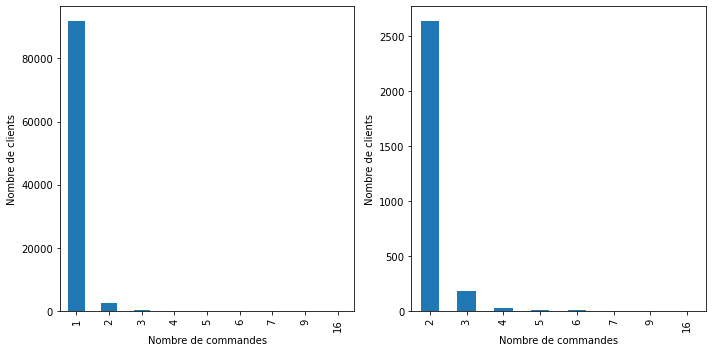

In [82]:
data_tmp = data_merge[["customer_unique_id", 'order_id']].drop_duplicates()
counts = data_tmp["customer_unique_id"].value_counts().value_counts()
print("Distribution du nombre de commandes par client")
print(counts)

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(10,5))
counts.sort_index().plot(kind="bar", ax=axs[0])
counts[counts.index>1].sort_index().plot(kind="bar", ax=axs[1])
for ax in axs :
    ax.set_ylabel("Nombre de clients")
    ax.set_xlabel("Nombre de commandes")
fig.tight_layout()
plt.show()

In [84]:
print(f"Nombre de clients ayant réalisé plus de 1 commande = {counts[counts.index>1].sum()}, soit {counts[counts.index>1].sum()/counts.sum()*100}%")

Nombre de clients ayant réalisé plus de 1 commande = 2869, soit 3.0288953875064664%


#### Montant dépensé par client

Montant minimum dépensé par un client : 0.85
Montant maximum dépensé par un client : 13440.0
Montant moyen dépensé par un client : 142.17486090741767
Montant median dépensé par un client : 89.8


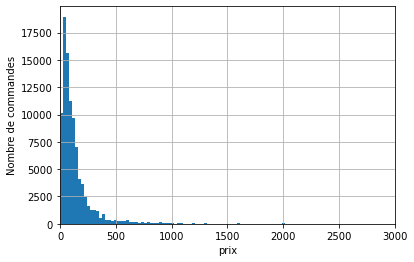

In [83]:
data_tmp = data_merge[["customer_unique_id",'order_id', 'price']]
data_tmp = data_tmp.groupby(by=["customer_unique_id"]).sum()
print(f"Montant minimum dépensé par un client : {data_tmp['price'].min()}")
print(f"Montant maximum dépensé par un client : {data_tmp['price'].max()}")
print(f"Montant moyen dépensé par un client : {data_tmp['price'].mean()}")
print(f"Montant median dépensé par un client : {data_tmp['price'].median()}")
data_tmp['price'].hist(bins=500)
plt.xlim((0,3000))
plt.ylabel('Nombre de commandes')
plt.xlabel("prix")
plt.show()

#### Montant de chaque commande

Prix minimum d'une commande : 0.85
Prix maximum d'une commande : 13440.0
Prix moyen d'une commande : 137.53428924509535
Prix median d'une commande : 86.9


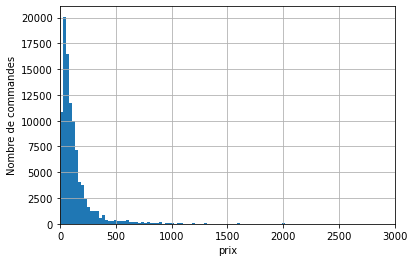

In [85]:
data_tmp = data_merge[['order_id', 'price']]
data_tmp = data_tmp.groupby(by=['order_id']).sum()
#print(data_tmp)
print(f"Prix minimum d'une commande : {data_tmp['price'].min()}")
print(f"Prix maximum d'une commande : {data_tmp['price'].max()}")
print(f"Prix moyen d'une commande : {data_tmp['price'].mean()}")
print(f"Prix median d'une commande : {data_tmp['price'].median()}")
data_tmp['price'].hist(bins=500)
plt.xlim((0,3000))
plt.ylabel('Nombre de commandes')
plt.xlabel("prix")
plt.show()

#### nombre d'articles par commande

Nombre d'articles minimum par commande : 1
Nombre d'articles maximum par commande : 21
Nombre d'articles moyen par commande : 1.1408437758509757
Nombre d'articles médian par commande : 1.0


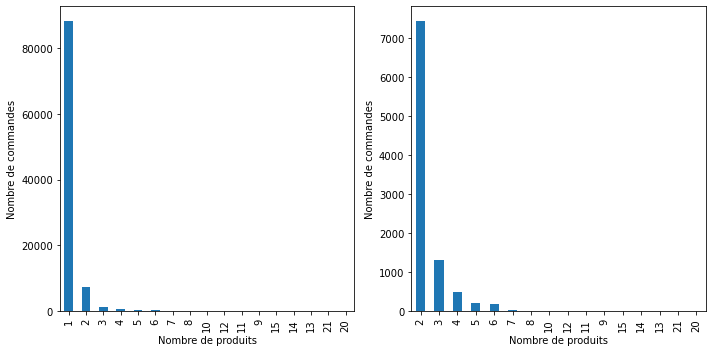

In [86]:
data_tmp = data_merge[['order_id', 'order_item_id']]
data_tmp = data_tmp.groupby(by=['order_id']).size()
print(f"Nombre d'articles minimum par commande : {data_tmp.min()}")
print(f"Nombre d'articles maximum par commande : {data_tmp.max()}")
print(f"Nombre d'articles moyen par commande : {data_tmp.mean()}")
print(f"Nombre d'articles médian par commande : {data_tmp.median()}")

counts = data_tmp.value_counts()
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(10,5))
counts.plot(kind="bar", ax=axs[0])
counts[counts.index>1].plot(kind="bar", ax=axs[1])
for ax in axs :
    ax.set_xlabel("Nombre de produits")
    ax.set_ylabel("Nombre de commandes")
fig.tight_layout()
plt.show()

#### Temps entre deux commandes

Temps minimum entre deux commandes : 0 days 00:00:01
Temps maximum entre deux commandes : 608 days 23:29:38
Temps moyen entre deux commandes : 86 days 16:20:39.268175583
Temps median entre deux commandes : 39 days 14:36:52


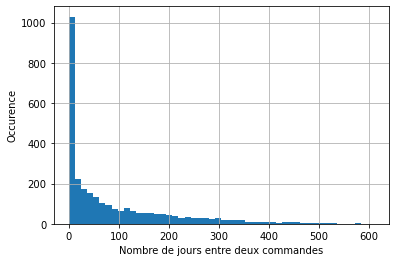

In [87]:
data_tmp = data_merge[['customer_unique_id', 'order_purchase_timestamp']].drop_duplicates()
data_tmp = data_tmp.sort_values(['customer_unique_id','order_purchase_timestamp'])
delta = data_tmp.groupby(by=["customer_unique_id"])['order_purchase_timestamp'].diff()
delta = delta.dropna()

print(f"Temps minimum entre deux commandes : {delta.min()}")
print(f"Temps maximum entre deux commandes : {delta.max()}")
print(f"Temps moyen entre deux commandes : {delta.mean()}")
print(f"Temps median entre deux commandes : {delta.median()}")

delta.dt.days.hist(bins=50)
plt.xlabel("Nombre de jours entre deux commandes")
plt.ylabel("Occurence")
plt.show()

#### Période de la base de données

In [88]:
print(f"Date de la première commande : {data_merge['order_purchase_timestamp'].min()}")
print(f"Date de la dernière commande : {data_merge['order_purchase_timestamp'].max()}")
print(f"Temps entre la première et la dernière commande : {data_merge['order_purchase_timestamp'].max()-data_merge['order_purchase_timestamp'].min()}")

Date de la première commande : 2016-09-04 21:15:19
Date de la dernière commande : 2018-09-03 09:06:57
Temps entre la première et la dernière commande : 728 days 11:51:38
